# Evaluate PseudoSpectralNet

This notebook is a template to evaluate trained models. In order to do we need to load the data and the model first!

The data is per default pre-computed in the `data-files` folder.

In [3]:
using Pkg
Pkg.activate(".") # assure it's the `scripts` env

# load all libraries
using QG3, Plots, NeuralQG3, JLD2, NNlib, LuxCUDA, NeuralDELux, ComponentArrays, SlurmHyperopt, BenchmarkTools, OrdinaryDiffEq, ParameterSchedulers, Optimisers, Random, SciMLSensitivity, Lux, Zygote, Statistics, CUDA, NODEData, Printf, EllipsisNotation

# GPU settings
const GPU = CUDA.functional()
const DEV = NeuralQG3.DetermineDevice(gpu=GPU)

#DATA_MODEL = :qg3 # or 
DATA_MODEL = :speedy
#DATA_MODEL = :era 

if DATA_MODEL == :qg3 
    NAME = "psn-long-swish-newhpc-final"
    COMPUTE_DATA = true # it's so fast, we can just always re-compute it 
    #SAVE_DIR = "../results/qg3-short/"
    SAVE_DIR = "../results/qg3-long/"
elseif DATA_MODEL == :speedy 
    #NAME = "psn-speedy-200d-filter"
    NAME = "psn-speedy-200d-sciml-filter-batch"
    SAVE_DIR = "../results/speedy/"
    COMPUTE_DATA = false
else 
    NAME = "psn-era-newhpc"
    SAVE_DIR = "../results/era/"
    COMPUTE_DATA = false # can't compute ERA5 data
end 

# load hyperpars 
other_hyperpars = NeuralQG3.training_hyperpars()
(; N_batch, DT_FAC, data_length) = other_hyperpars
(; SAVE_NAME, SAVE_NAME_MODEL, SAVE_NAME_RESULTS, SAVE_NAME_SOL) = NeuralQG3.setup_savenames(; save_dir=SAVE_DIR, default_name=NAME)

@load SAVE_NAME_MODEL psn_hyperpars
println("Eval model with hyperpars:")
println(psn_hyperpars.pars)

# load process-based core 
S, qg3ppars, ψ_0, q_0 = load_data("T42", GPU=GPU)
qg3p = CUDA.@allowscalar QG3Model(qg3ppars; N_batch=1)
T = eltype(qg3p)
DT = T((2π/144)*DT_FAC) # in MM code: 1/144 * 2π
data_length = DT_FAC * data_length

# print our process-based core to be certain of resolution and GPU 
println(qg3p)

# load data 
(t, q) = NeuralQG3.get_data(DATA_MODEL, qg3p, COMPUTE_DATA; S=S, DT=DT, q_0=q_0, t_save_length=data_length, speedy_file_name="../data-files/speedy/speedy-qt-precomputed.jld2")
DT = DATA_MODEL == :era ? T(t[2]-t[1]) : DT

q = GPU ? T.(QG3.reorder_SH_gpu(q, qg3ppars)) : T.(q);

  Activating 

using data / saving data as ../results/speedy/psn-speedy-200d-sciml-filter-batch-model-pars.jld2


project at `/p/tmp/maxgelbr/code/nqg3-final/NeuralQG3.jl/scripts`


Eval model with hyperpars:
(N_layers = 3, N_Nodes = 50, N_channels = 3, unet_kwargs = (kernel = (3, 3), N_channels = [24, 48, 48, 96], downconv = NeuralQG3.LongLatConvBlock, upconv = NeuralQG3.LongLatConvBlock), activation = NNlib.swish, additional_knowledge = true, conv_mode = :unet, znorm = true)
Pre-computed QG3Model{Float32} with  QG3ModelParameters{Float32} with N_lats=64 N_lons=128 L_max=42 on a Gaussian Grid on GPUwith gridsize (64, 130) and L_max42 on GPU
Loading Speedy Data


Now, we set up the data loaders, here we don't want the regular batched data loaders we used during training, as we only want to predict a single sample. 

In [6]:
train, valid, test = CUDA.@allowscalar NODEData.SingleTrajectoryBatchedOSADataloader(q, t, N_batch, valid_set=0.1, test_set=0.1);
train = NODEData.NODEDataloader_insertdim(train, 2)
test = NODEData.NODEDataloader_insertdim(test, 2)

┌ Warning: Not all data points are used, N_batch is not a divisor of the length of the trajectory
└ @ NODEData ~/.julia/packages/NODEData/dBpb7/src/batched.jl:106


NODEData{CuArray{Float32, 5, CUDA.DeviceMemory},Int64} with 632 batches with length 2

No, lets set up the models, and make an initial forecast to check everything is right

In [5]:
#neural_de, ps, st = load_psn_ad(qg3p, psn_hyperpars, DT, N_batch; SAVE_NAME=SAVE_NAME, device=DEV)
S = psn_hyperpars.pars[:additional_knowledge] ? S : nothing
neural_de_sciml, ps, st = NeuralQG3.load_psn_sciml(qg3p, psn_hyperpars, DT; SAVE_NAME=SAVE_NAME, device=DEV, S=S, dtmax=DT, alg=Tsit5())
N_length = DATA_MODEL == :qg3 ? 400 : 300
test_trajectory = NODEData.get_trajectory(test, N_length)
grid_forecast = NeuralQG3.GridForecast(test_trajectory, qg3p.g.SHtoG, N_forecast=175, input_SH=true, output_SH=true, data_SH=true, trajectory_call=false)
gf = grid_forecast(neural_de_sciml, ps, st)

(forecast_delta = Float32[0.0, 0.0046771816, 0.010830544, 0.011751213, 0.016650576, 0.022347445, 0.023605581, 0.027385365, 0.032893218, 0.03390473  …  0.49743855, 0.50055385, 0.5045876, 0.5078464, 0.5127029, 0.5155059, 0.52025133, 0.52417636, 0.5282946, 0.5330156],)

## Load Baselines

... and make forecasts with all models to compare them. First just a single trajectory to get an initial impression.

In [7]:
ground_truth_grid = QG3.transform_grid_data(test_trajectory[2][..,1,:], qg3p)
 
forecast_model_q,st = neural_de_sciml(test_trajectory, ps, st)
forecast_model = QG3.transform_grid_data(forecast_model_q[..,1,:], qg3p);

In [8]:
# baselines 
baseline_J = NeuralQG3.JBaseline(qg3p);
forecast_J, __ = baseline_J((test_trajectory[1],test_trajectory[2][..,1,:]), nothing, NamedTuple())
forecast_J_grid = QG3.transform_grid_data(forecast_J, qg3p);

In [9]:
baseline_QG3 = NeuralQG3.QG3Baseline(qg3p);
forecast_QG3, __ = baseline_QG3((test_trajectory[1], test_trajectory[2][..,1,:]), nothing, NamedTuple())
forecast_QG3_grid = QG3.transform_grid_data(forecast_QG3, qg3p);

In [10]:
# climatology baseline, just repeat the climatology as a baseline
q_clim = mean(q, dims=4)

struct ClimatologyBaseline{T} 
    climatology::T
end 

(clim::ClimatologyBaseline)(X, ps, st) = repeat(clim.climatology,1,1,1,size(X[1],1)), st

baseline_clim = ClimatologyBaseline(q_clim)
forecast_clim, __ = baseline_clim((test_trajectory[1], test_trajectory[2][..,1,:]), nothing, NamedTuple());
forecast_clim_grid = QG3.transform_grid_data(forecast_clim, qg3p);

In [11]:
# this is directly grid based
save_name_baseline_unet_rnn = DATA_MODEL ==:qg3 ? "unet-rnn-qg3-newhpc" : DATA_MODEL == :speedy ? "unet-rnn-speedy-newhpc" : "unet-rnn-era-newhpc"

baseline_unet_rnn, ps_rnn, st_rnn = NeuralQG3.load_rnn_unet(save_name_baseline_unet_rnn; save_dir=SAVE_DIR, dev=DEV)
forecast_unet_rnn_grid, st_rnn = NeuralDELux.trajectory(baseline_unet_rnn, (test_trajectory[1], reshape(ground_truth_grid, size(ground_truth_grid)[1:3]..., 1, size(ground_truth_grid,4))), ps_rnn, st_rnn);
forecast_unet_rnn_grid = forecast_unet_rnn_grid[..,1,:];

using data / saving data as ../results/speedy/unet-rnn-speedy-newhpc-model-pars.jld2


In [12]:
save_name_baseline_unet_node = DATA_MODEL ==:qg3 ? "unet-baseline-sh-qg3-2" : DATA_MODEL == :speedy ? "unet-baseline-sh-200d" :  "unet-baseline-sh-era"

names_unet = NeuralQG3.setup_savenames(; save_dir=SAVE_DIR, default_name=save_name_baseline_unet_node)
SAVE_NAME_UNET = names_unet[:SAVE_NAME]
SAVE_NAME_MODEL_UNET = names_unet[:SAVE_NAME_MODEL]
unet_hyperpars = load_object(SAVE_NAME_MODEL_UNET)

baseline_unet_node, ps_unetnode, st_unetnode = NeuralQG3.load_psn_sciml(qg3p, unet_hyperpars, DT; SAVE_NAME=SAVE_NAME_UNET, device=DEV, process_based=false, S=nothing, dtmax=DT)
forecast_unet_node, st_unetnode = baseline_unet_node(test_trajectory, ps_unetnode, st_unetnode)

forecast_unet_node_grid = QG3.transform_grid_data(forecast_unet_node[:,:,:,1,:], qg3p);

using data / saving data as ../results/speedy/unet-baseline-sh-200d-model-pars.jld2


now compare the forecast with the $\delta$ metric

In [13]:
δ_long_psn = NeuralQG3.forecast_δ(forecast_model, ground_truth_grid, "norm")[:]
δ_long_J = NeuralQG3.forecast_δ(forecast_J_grid, ground_truth_grid, "norm")[:]
δ_long_clim = NeuralQG3.forecast_δ(forecast_clim_grid, ground_truth_grid, "norm")[:]
δ_long_QG3 =  NeuralQG3.forecast_δ(forecast_QG3_grid, ground_truth_grid, "norm")[:]
δ_long_RNN =  NeuralQG3.forecast_δ(forecast_unet_rnn_grid, ground_truth_grid, "norm")[:]
δ_long_UNET =  NeuralQG3.forecast_δ(forecast_unet_node_grid, ground_truth_grid, "norm")[:];

and plot those

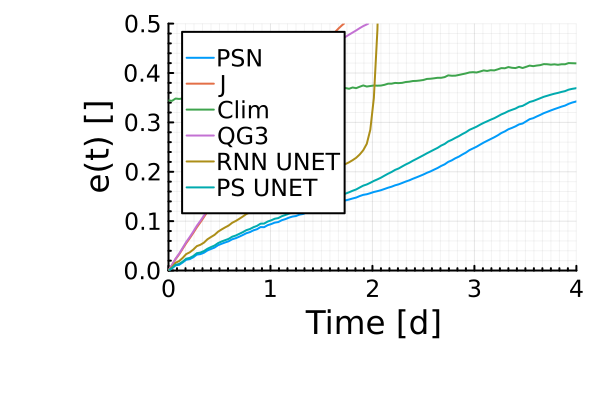

In [14]:
YLIMS = DATA_MODEL == :qg3 ? [0, 0.2] : [0, 0.5]

dtSI = (DT*qg3p.p.time_unit)
t_axis = 0:dtSI:dtSI*(length(δ_long_psn)-1)
plot(t_axis, Array(δ_long_psn), label="PSN")
plot!(t_axis, Array(δ_long_J), label="J")
plot!(t_axis, Array(δ_long_clim), label="Clim")
if DATA_MODEL != :qg3 # that's just the ground truth for this experiment
    plot!(t_axis, Array(δ_long_QG3), label="QG3")
end 

plot!(t_axis, Array(δ_long_RNN), label="RNN UNET", ylim=YLIMS, minorgrid=true, xminorticks=12, grid=:all, thickness_scaling = 2,xlabel="Time [d]", ylabel="e(t) []", fontsize=20,xlims=[0,4])
plot!(t_axis, Array(δ_long_UNET), label="PS UNET", ylim=YLIMS, minorgrid=true, xminorticks=12, grid=:all, thickness_scaling = 2,xlabel="Time [d]", ylabel="e(t) []", fontsize=20,xlims=[0,4])

Now, let's look at the average forecast delta instead! That's a bit more proper way. 

In [15]:
# modify length of forecast here
dtSI = (DT*qg3p.p.time_unit)
N_forecast = 250
t_axis = 0:dtSI:dtSI*(N_forecast-1)
test_2 = (test_trajectory[1], test_trajectory[2][..,1,:])

grid_forecast_avg_delta = NeuralQG3.GridForecast(test_trajectory, qg3p.g.SHtoG, input_SH=true, output_SH=true, data_SH=true, modes=("average_forecast_delta"), N_avg=20, N_forecast=N_forecast, trajectory_call=false)
grid_forecast_avg_delta_no_batch = NeuralQG3.GridForecast(test_2, qg3p.g.SHtoG, input_SH=true, output_SH=true, data_SH=true, modes=("average_forecast_delta"), N_avg=20, trajectory_call=false, N_forecast=N_forecast)
grid_forecast_avg_delta_rnn = NeuralQG3.GridForecast(test_trajectory, qg3p.g.SHtoG, input_SH=false, output_SH=false, data_SH=true, modes=("average_forecast_delta"), N_avg=20, trajectory_call=true, N_forecast=N_forecast);

In [16]:
grid_forecast_avg_delta_clim = NeuralQG3.GridForecast(test_2, qg3p.g.SHtoG, input_SH=true, output_SH=true, data_SH=true, modes=("average_forecast_delta"), N_avg=100, trajectory_call=false, N_forecast=200);


In [17]:
δ_avg_psn=grid_forecast_avg_delta(neural_de_sciml, ps, st)[:average_forecast_delta]; 

In [46]:
# only for the comparision in the QG3 experiment
#δ_avg_psn_short=grid_forecast_avg_delta(neural_de_sciml, ps, st)[:average_forecast_delta]; 

In [18]:
δ_avg_UNET=grid_forecast_avg_delta(baseline_unet_node, ps_unetnode, st_unetnode)[:average_forecast_delta]; # works

In [19]:
δ_avg_RNN=grid_forecast_avg_delta_rnn(baseline_unet_rnn, ps_rnn, st_rnn)[:average_forecast_delta]; # works

In [20]:
δ_avg_QG3=grid_forecast_avg_delta_no_batch(baseline_QG3, nothing, NamedTuple())[:average_forecast_delta] # works
δ_avg_J=grid_forecast_avg_delta_no_batch(baseline_J, nothing, NamedTuple())[:average_forecast_delta]; # works
δ_avg_clim=grid_forecast_avg_delta_no_batch(baseline_clim, nothing, NamedTuple())[:average_forecast_delta]; # works

In [21]:
δ_avg_clim=grid_forecast_avg_delta_clim(baseline_clim, nothing, NamedTuple())[:average_forecast_delta]; # works

Plot it in the same way as above

In [19]:
#only for the comparision in the QG3 experiment
@load "../results/qg3-short/delta-avg-psn-short-swish-newhpc.jld2" δ_avg_psn_short

1-element Vector{Symbol}:
 :δ_avg_psn_short

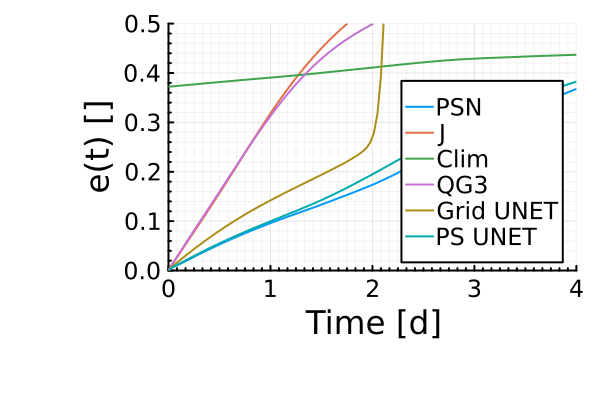

In [22]:
fig = plot()
YLIMS = DATA_MODEL == :qg3 ? [0, 0.15] : [0, 0.5]
t_axis_plot2 = t_axis[1:length(Array(δ_avg_psn))]
plot!(fig, t_axis_plot2, Array(δ_avg_psn), label="PSN")
#plot!(t_axis_plot2, Array(δ_avg_psn_short), label="PSN (short)")
plot!(fig, t_axis_plot2, Array(δ_avg_J), label="J")
plot!(fig, t_axis_plot2[1:length(Array(δ_avg_clim))], Array(δ_avg_clim), label="Clim")

plot!(fig, t_axis_plot2, Array(δ_avg_QG3), label="QG3")
plot!(fig, t_axis_plot2, Array(δ_avg_RNN), label="Grid UNET")
plot!(fig, t_axis_plot2, Array(δ_avg_UNET), label="PS UNET", ylim=YLIMS, xlim=[0,4], minorgrid=true, xminorticks=12, grid=:all, thickness_scaling = 2,xlabel="Time [d]", ylabel="e(t) []", fontsize=20)

savefig(fig, string(SAVE_DIR,"delta-",NAME,".pdf"))
fig 

Thresholds (for the paper): 

In [36]:
(findall(δ_avg_psn .> 0.1)[1] * dtSI) * 24

26.666664f0

In [31]:
(findall(δ_avg_psn .> 0.2)[1] * dtSI) * 24

55.833332f0

In [32]:
(findall(δ_avg_UNET .> 0.1)[1] * dtSI) * 24

25.0f0

In [33]:
(findall(δ_avg_UNET .> 0.2)[1] * dtSI) * 24

50.0f0

In [34]:
(findall(δ_avg_RNN .> 0.1)[1] * dtSI) * 24

16.666666f0

In [35]:
(findall(δ_avg_RNN .> 0.2)[1] * dtSI) * 24

38.33333f0

Save those for later comparison and for editing the plot: 

In [23]:
save_δ_avg_models = string(SAVE_DIR, "delta-avg-",NAME,".jld2")
#δ_avg_psn_short = δ_avg_psn
@save save_δ_avg_models δ_avg_psn_short

In [23]:
if DATA_MODEL==:qg3
jldsave(string(SAVE_DIR, "plot_data_delta_",NAME,".jld2"); δ_avg_psn=Array(δ_avg_psn), δ_avg_psn_short=Array(δ_avg_psn_short), 
        δ_avg_J=Array(δ_avg_J), δ_avg_QG3=Array(δ_avg_QG3), δ_avg_RNN=Array(δ_avg_RNN), δ_avg_UNET=Array(δ_avg_UNET))
end  
if DATA_MODEL==:speedy # NOW SHORT DATA case
jldsave(string(SAVE_DIR,"plot_data_delta_",NAME,".jld2"); δ_avg_psn=Array(δ_avg_psn), 
    δ_avg_J=Array(δ_avg_J), δ_avg_QG3=Array(δ_avg_QG3), δ_avg_RNN=Array(δ_avg_RNN), δ_avg_UNET=Array(δ_avg_UNET))
end 
if DATA_MODEL==:era # NOW SHORT DATA case
jldsave(string(SAVE_DIR,"plot_data_delta_",NAME,".jld2"); δ_avg_psn=Array(δ_avg_psn), 
    δ_avg_J=Array(δ_avg_J), δ_avg_QG3=Array(δ_avg_QG3), δ_avg_RNN=Array(δ_avg_RNN), δ_avg_UNET=Array(δ_avg_UNET))
end 
        

## Trajectory Animations

and plot the short term forecasts and compare them.

In [24]:
vertical_level = 2 # 2 -> 500hPa 
plot_var = :ψ

if plot_var == :q 
    diff_field = Array(forecast_model - ground_truth_grid)[vertical_level,end:-1:1,:,:]
    model_field = Array(forecast_model)[vertical_level,end:-1:1,:,:]
    ground_truth_field = ground_truth_grid
elseif plot_var == :ψ 
    model_field = Array(QG3.transform_grid_data(qprimetoψ(qg3p, forecast_model_q[..,1,:]), qg3p))[vertical_level,:,:,:]
    ground_truth_field = Array(QG3.transform_grid_data(qprimetoψ(qg3p, test_trajectory[2][..,1,:]), qg3p))[vertical_level,:,:,:]

    diff_field = model_field - ground_truth_field
else 
    error("Unkown plot_var")
end 

# reverse array order, so that north is on top of the plot 
diff_field = reverse(diff_field, dims=1)
model_field = reverse(model_field, dims=1)
ground_truth_field = reverse(ground_truth_field, dims=1);

[ Info: Saved animation to /p/tmp/maxgelbr/code/neuralqg-hpc2/neuralqg3/results/qg3-long/model-anim-psn-long-swish-newhpc-4.gif


Plots.AnimatedGif("/p/tmp/maxgelbr/code/neuralqg-hpc2/neuralqg3/results/qg3-long/model-anim-psn-long-swish-newhpc-4.gif")
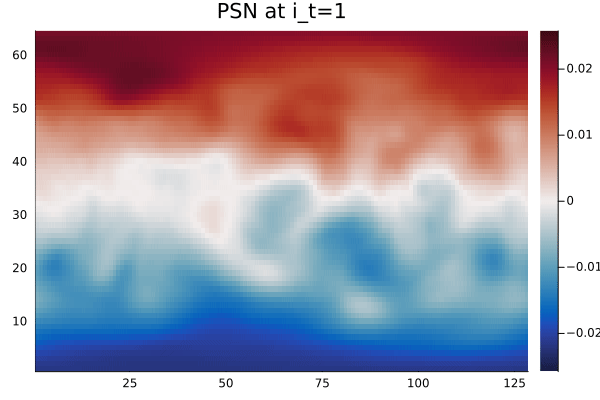

In [22]:
plot_field = (test_trajectory[1], Array(QG3.transform_grid_data(qprimetoψ(qg3p, forecast_model_q[..,1,:]), qg3p))[1,:,:,:])
anim, clims = NeuralQG3.animation(plot_field, title="PSN", return_clims=true)
gif(anim, string(SAVE_DIR,"model-anim-",NAME,".gif"), fps=30)

In [19]:
plot_field = (test_trajectory[1], Array(QG3.transform_grid_data(qprimetoψ(qg3p, test_trajectory[2][..,1,:]), qg3p))[1,:,:,:])
anim = NeuralQG3.animation(plot_field, title="Truth", clims=clims)
#gif(anim, string(SAVE_DIR,"truth-anim-",NAME,".gif"), fps=30)

Animation("/p/tmp/maxgelbr/anaconda/jl_Ulr6XS", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000291.png", "000292.png", "000293.png", "000294.png", "000295.png", "000296.png", "000297.png", "000298.png", "000299.png", "000300.png"])

In [20]:
plot_field = (test_trajectory[1], Array(QG3.transform_grid_data(qprimetoψ(qg3p, forecast_model_q[..,1,:]), qg3p))[1,:,:,:] - Array(QG3.transform_grid_data(qprimetoψ(qg3p,test_trajectory[2][..,1,:]), qg3p))[1,:,:,:]) 
anim = NeuralQG3.animation(plot_field, title="Diff", clims=clims)
#gif(anim, string(SAVE_DIR,"model-diff-anim-",NAME,".gif"), fps=30)

Animation("/p/tmp/maxgelbr/anaconda/jl_6vBRUU", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000291.png", "000292.png", "000293.png", "000294.png", "000295.png", "000296.png", "000297.png", "000298.png", "000299.png", "000300.png"])

# Snapshot Plots

In [27]:
indices = DATA_MODEL == :speedy ? 2 .* [14,28,42,56] : [100,200,300,400]

#indices=[14,28,42,56]
#indices=
#indices = 
clims =  (-1.0*maximum(abs.(model_field)),1.0*maximum(abs.(model_field))) # get colormap maxima
println(string("Plotting Snapshots at time steps [d] :",indices .* DT .* qg3p.p.time_unit))

Plotting Snapshots at time steps [d] :Float32[3.472222, 6.944444, 10.416666, 13.888888]


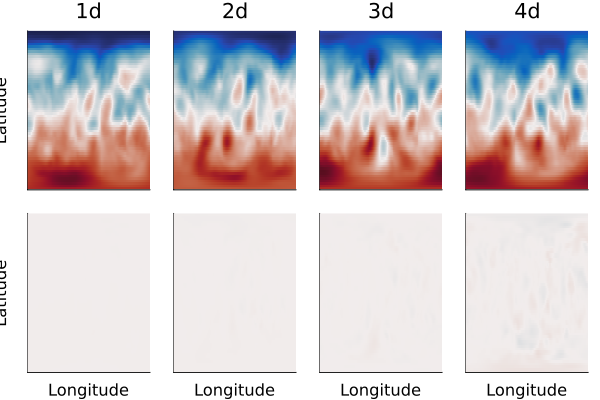

In [52]:
p1=heatmap(model_field[:,:,indices[1]],c=:balance,clims=clims, ylabel="Latitude", colorbar=nothing, yticks = nothing, xticks= nothing, title="1d")
p2=heatmap(model_field[:,:,indices[2]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xticks= nothing, title="2d")
p3=heatmap(model_field[:,:,indices[3]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xticks= nothing, title="3d")
p4=heatmap(model_field[:,:,indices[4]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xticks= nothing, title="4d")

p5=heatmap(diff_field[:,:,indices[1]],c=:balance,clims=clims, ylabel="Latitude", colorbar=nothing, xlabel="Longitude", yticks = nothing, xticks= nothing)
p6=heatmap(diff_field[:,:,indices[2]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xlabel="Longitude", xticks= nothing)
p7=heatmap(diff_field[:,:,indices[3]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xlabel="Longitude", xticks= nothing)
p8=heatmap(diff_field[:,:,indices[4]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xlabel="Longitude", xticks= nothing)

plot(p1,p2,p3,p4,p5,p6,p7,p8, layout=(2,4), legend=false)
#savefig(string(SAVE_DIR,"snapshots-",NAME,".pdf"))

In [29]:
lons = 1:128 
lats = 1:64
N_levels = 16
aspect = 1

p1=contourf(lons, lats, model_field[:,:,indices[1]],c=:balance,clims=clims, ylabel="Latitude", colorbar=nothing, levels=N_levels, yticks = nothing, xticks= nothing, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]], title="1d", aspect_ratio=aspect)
p2=contourf(model_field[:,:,indices[2]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xticks= nothing, title="2d", levels=N_levels, aspect_ratio=aspect, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]])
p3=contourf(model_field[:,:,indices[3]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xticks= nothing, title="3d", levels=N_levels, aspect_ratio=aspect, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]])
p4=contourf(model_field[:,:,indices[4]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xticks= nothing, title="4d", levels=N_levels, aspect_ratio=aspect, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]])

if DATA_MODEL == :qg3 # zoom-in in the QG3 experiment plot
    clims = clims ./ 10 # for QG3 Plot
end 

p5=contourf(diff_field[:,:,indices[1]],c=:balance,clims=clims, ylabel="Latitude", colorbar=nothing, xlabel="Longitude", yticks = nothing, xticks= nothing, levels=N_levels, aspect_ratio=aspect, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]])
p6=contourf(diff_field[:,:,indices[2]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xlabel="Longitude", xticks= nothing, levels=N_levels, aspect_ratio=aspect, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]])
p7=contourf(diff_field[:,:,indices[3]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xlabel="Longitude", xticks= nothing, levels=N_levels, aspect_ratio=aspect, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]])
p8=contourf(diff_field[:,:,indices[4]],c=:balance,clims=clims, yticks = nothing, colorbar=nothing, xlabel="Longitude", xticks= nothing, levels=N_levels, aspect_ratio=aspect, xlims=[lons[1],lons[end]], ylims=[lats[1],lats[end]])

plot(p1,p2,p3,p4,p5,p6,p7,p8, layout=(2,4), legend=false)
#savefig(string(SAVE_DIR,"snapshots-contour",NAME,".pdf"))

"/p/tmp/maxgelbr/code/neuralqg-hpc2/neuralqg3/results/qg3-long/snapshots-contourpsn-long-swish-newhpc-4.pdf"

In [36]:
plot(p1, colorbar=true)
savefig(string(SAVE_DIR,"snapshots-contour-colorbar",NAME,".pdf"))

"/p/tmp/maxgelbr/code/neuralqg-hpc2/neuralqg3/results/qg3-long/snapshots-contour-colorbarpsn-long-swish-newhpc-4.pdf"

In [37]:
plot(p5, colorbar=true)
savefig(string(SAVE_DIR,"snapshots-contour-colorbar-difference-",NAME,".pdf"))

"/p/tmp/maxgelbr/code/neuralqg-hpc2/neuralqg3/results/qg3-long/snapshots-contour-colorbar-difference-psn-long-swish-newhpc-4.pdf"

In [42]:
jldsave(string(SAVE_DIR,"plot_data_snapshots-contour-colorbar-",NAME,".jld2"); model_field, diff_field)

In [ ]:
loaded_fields = jldopen("results/qg3-long/plot_data_snapshots-contour-colorbar-psn-long.jld2")
model_field = loaded_fields["model_field"]
diff_field = loaded_fields["diff_field"]

## Error by Latitude 

analyse the error by latitude 

In [61]:
grid_forecast_latitude = NeuralQG3.GridForecast(test_trajectory, qg3p.g.SHtoG,input_SH=true, output_SH=true, data_SH=true, trajectory_call=false, modes=("latitude_delta"))

latitude_error = grid_forecast_latitude(neural_de_sciml, ps, st)

(latitude_delta = Float32[0.0 0.0 … 0.0 0.0;;;;; 0.0027067054 0.003133646 … 0.006138813 0.004075598;;;;; 0.009729707 0.01009869 … 0.015466381 0.0149436975;;;;; … ;;;;; 0.071976416 0.122525975 … 0.22281367 0.18646458;;;;; 0.07163191 0.12363513 … 0.22352214 0.1864324;;;;; 0.07489037 0.12622544 … 0.22702552 0.19118313],)

and plot that...

In [63]:
heatmap(latitude_error[:latitude_delta][1,:,1,1,:], xlabel="Time Step", ylabel="Latitude", title="Normalized Error by Latitude")
savefig(string(SAVE_DIR,"latitude-error-",NAME,".pdf"))

"/p/tmp/maxgelbr/code/neuralqg-hpc2/neuralqg3/results/speedy/latitude-error-psn-speedy-200d-filter.pdf"